# Challenge 2: Customer Churn Prediction
- Challenge: Predictive model to identify customers at high risk of churning.
- Deliverables: A Jupyter Notebook with data preprocessing, feature engineering, model selection, and evaluation. A presentation highlighting key predictors of churn and model performance.
- Data Source: Kaggle's "Telco Customer Churn" dataset.

# 1. Obtain the Dataset
- Download the zip file from "Telco Customer Churn" dataset at https://www.kaggle.com/datasets/blastchar/telco-customer-churn?resource=download
- Extract the file WA_Fn-UseC_-Telco-Customer-Churn.csv into the same folder where the notebook is located.
- Explore the CSV using a text editor (like Notepad++) 

In [1]:
# install Pyarrow to avoid the deprecation warning
import pandas as pd

# read the CSV file using pandas library to create a new dataframe (df)
df = pd.read_csv("WA_Fn-UseC_-Telco-Customer-Churn.csv")

# duplicate the df to avoid the warning "A value is trying to be set on a copy of a slice from a DataFrame."
df = df.copy()

# print dataframe shape
print (df.shape)

#show top 10 data
df.head(10)

(7043, 21)


,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
5,9305-CDSKC,Female,0,No,No,8,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,Yes
6,1452-KIOVK,Male,0,No,Yes,22,Yes,Yes,Fiber optic,No,...,No,No,Yes,No,Month-to-month,Yes,Credit card (automatic),89.10,1949.4,No
7,6713-OKOMC,Female,0,No,No,10,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,No,Mailed check,29.75,301.9,No
8,7892-POOKP,Female,0,Yes,No,28,Yes,Yes,Fiber optic,No,...,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes
9,6388-TABGU,Male,0,No,Yes,62,Yes,No,DSL,Yes,...,No,No,No,No,One year,No,Bank transfer (automatic),56.15,3487.95,No


# 2. Data Cleaning
Before we can use the data, we need to preprocess it. This typically involves handling missing values, encoding categorical variables, and creating the RFM features.

In [2]:
# Check the columns data types. Are they all correct?
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [3]:
# Remove rows with non-numerical values in the "TotalCharges" column  
df = df[pd.to_numeric(df["TotalCharges"], errors='coerce').notnull()]

# Convert the "TotalCharges" column to float  
df["TotalCharges"] = df["TotalCharges"].astype(float)

df.info()

df

<class 'pandas.core.frame.DataFrame'>
Index: 7032 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7032 non-null   object 
 1   gender            7032 non-null   object 
 2   SeniorCitizen     7032 non-null   int64  
 3   Partner           7032 non-null   object 
 4   Dependents        7032 non-null   object 
 5   tenure            7032 non-null   int64  
 6   PhoneService      7032 non-null   object 
 7   MultipleLines     7032 non-null   object 
 8   InternetService   7032 non-null   object 
 9   OnlineSecurity    7032 non-null   object 
 10  OnlineBackup      7032 non-null   object 
 11  DeviceProtection  7032 non-null   object 
 12  TechSupport       7032 non-null   object 
 13  StreamingTV       7032 non-null   object 
 14  StreamingMovies   7032 non-null   object 
 15  Contract          7032 non-null   object 
 16  PaperlessBilling  7032 non-null   object 
 17  

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.50,No
7039,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.90,No
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.60,Yes


In [4]:
# Data exploration: how many "Null" rows do we have? And Where?
pd.set_option('display.max_rows', None) # needed to display all columns
df.isnull().sum().sort_values(ascending=False)

customerID          0
DeviceProtection    0
TotalCharges        0
MonthlyCharges      0
PaymentMethod       0
PaperlessBilling    0
Contract            0
StreamingMovies     0
StreamingTV         0
TechSupport         0
OnlineBackup        0
gender              0
OnlineSecurity      0
InternetService     0
MultipleLines       0
PhoneService        0
tenure              0
Dependents          0
Partner             0
SeniorCitizen       0
Churn               0
dtype: int64

# 3. Data Exploration
Here are some suggested metrics to visualize:
1) Bar Chart: Gender Distribution
2) Pie Chart: Contract Type Distribution
3) Histogram: Monthly Charges Distribution
4) Stacked Bar Chart: Churn by Internet Service

gender
Male      3549
Female    3483
Name: count, dtype: int64

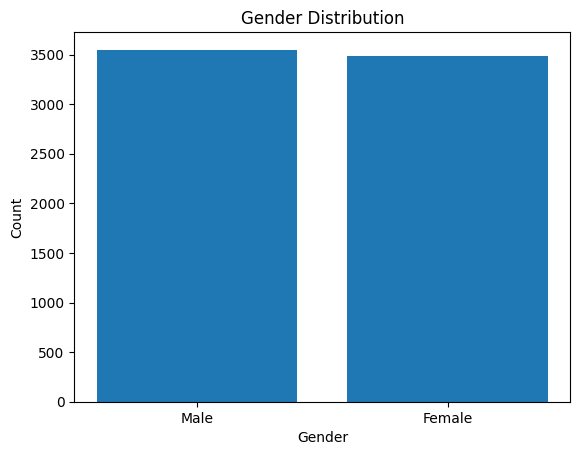

In [5]:
# 1) Bar Chart: Gender Distribution
# - Create a bar chart to visualize the distribution of customers based on gender.
# - X-axis: Gender (Male, Female)
# - Y-axis: Count of customers

import pandas as pd  
import matplotlib.pyplot as plt
  
# Count the number of customers by gender  
gender_counts = df["gender"].value_counts()

# Display the split in tabular format
display(gender_counts)

# Create the bar chart  
plt.bar(gender_counts.index, gender_counts.values)
  
# Set the labels and title
plt.xlabel("Gender")
plt.ylabel("Count")
plt.title("Gender Distribution")
  
# Display the chart  
plt.show()  

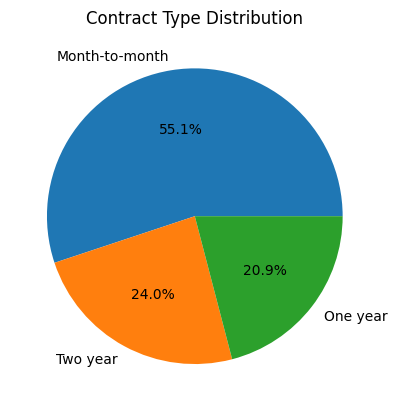

In [6]:
# 2) Pie Chart: Contract Type Distribution
# - Create a pie chart to visualize the distribution of customers based on contract type.
# - Each slice represents a different contract type (e.g., month-to-month, one year, two years).
# - This will help you understand the proportion of customers with different contract types.

import pandas as pd
import matplotlib.pyplot as plt
  
# Count the number of customers by contract type
contract_counts = df["Contract"].value_counts()
  
# Create the pie chart
plt.pie(contract_counts.values, labels=contract_counts.index, autopct='%1.1f%%')
  
# Set the title
plt.title("Contract Type Distribution")
  
# Display the chart
plt.show()

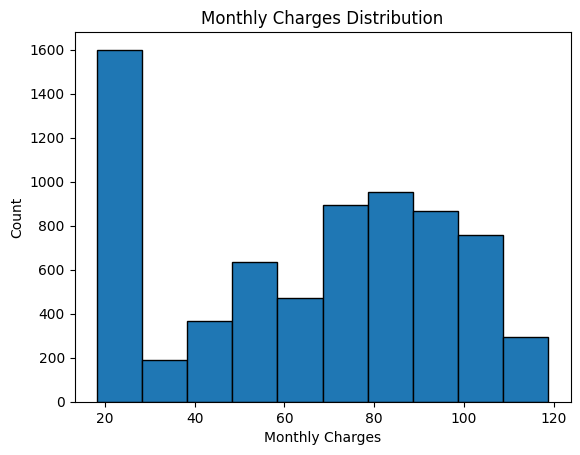

In [7]:
# 3) Histogram: Monthly Charges Distribution
# - Create a histogram to visualize the distribution of monthly charges.
# - X-axis: Monthly charges range
# - Y-axis: Count of customers
# - This will help you understand the distribution of monthly charges among customers.

import pandas as pd
import matplotlib.pyplot as plt
  
# Create the histogram
plt.hist(df["MonthlyCharges"], bins=10, edgecolor='black')
  
# Set the labels and title
plt.xlabel("Monthly Charges")
plt.ylabel("Count")
plt.title("Monthly Charges Distribution")
  
# Display the chart
plt.show()

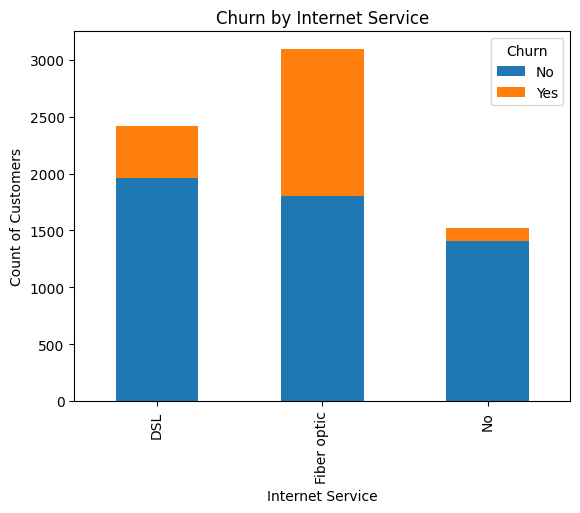

In [8]:
# 4) Stacked Bar Chart: Churn by Internet Service
# - Create a stacked bar chart to compare the churn rate based on the type of internet service.
# - X-axis: Internet Service (DSL, Fiber optic, No)
# - Y-axis: Count of customers
# - Stacked bars represent the churned and non-churned customers for each internet service type.
# -  This will help you analyze the churn rate based on the type of internet service customers are using.

import pandas as pd
import matplotlib.pyplot as plt
  
# Count the number of churned and non-churned customers by internet service  
churn_counts = df.groupby(["InternetService", "Churn"]).size().unstack()  
  
# Create the stacked bar chart  
churn_counts.plot(kind="bar", stacked=True)  
  
# Set the labels and title  
plt.xlabel("Internet Service")  
plt.ylabel("Count of Customers")  
plt.title("Churn by Internet Service")  
  
# Display the chart  
plt.show()

## Data Preprocessing
- Remove un-wanted columns from features (customerID and Churn)
- Split the dataset into training and testing sets.
- Convert categorical variables into numerical representations (e.g., one-hot encoding).

In [9]:
# Remove un-wanted columns from features (customerID and Churn)
X = df.drop(["customerID","Churn"], axis = 1)
y = df["Churn"] # label

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
[d.shape for d in (X_train, X_test, y_train, y_test)]

[(5625, 19), (1407, 19), (5625,), (1407,)]

In [10]:
# identify non-numerical columns
non_numerical_cols = X.select_dtypes(include='object').columns.tolist()

# encode categorical columns but keep the numerical columns through the remainder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

transformer = ColumnTransformer(
    transformers=[('encoder', OneHotEncoder(), non_numerical_cols)],
    remainder='passthrough') # This specifies that all other columns should be kept

df_encoded = transformer.fit_transform(X)
print(f"df_encoded.shape: {df_encoded.shape}")

# Split the dataset into training and testing sets.
# recall: you need to split df_encoded between train and test, while the label is always the same
X_train_encoded, X_test_encoded, y_train, y_test = train_test_split(df_encoded, y, test_size=0.2, random_state=42)

print ("Train / Test dataframes: ", [d.shape for d in (X_train_encoded, X_test_encoded, y_train, y_test)])

df_encoded.shape: (7032, 45)
Train / Test dataframes:  [(5625, 45), (1407, 45), (5625,), (1407,)]


In [11]:
# Just for confirmation: print the encoded dataframe
import scipy, numpy

column_names = transformer.get_feature_names_out()
if (type(df_encoded) == pd.core.frame.DataFrame) or (type(df_encoded) == numpy.ndarray):
    df_encoded_printable = pd.DataFrame(df_encoded, columns=column_names)
elif type(df_encoded) == scipy.sparse._csr.csr_matrix:
    df_encoded_printable = pd.DataFrame(df_encoded.A, columns=column_names)
    
df_encoded_printable

,encoder__gender_Female,encoder__gender_Male,encoder__Partner_No,encoder__Partner_Yes,encoder__Dependents_No,encoder__Dependents_Yes,encoder__PhoneService_No,encoder__PhoneService_Yes,encoder__MultipleLines_No,encoder__MultipleLines_No phone service,...,encoder__PaperlessBilling_No,encoder__PaperlessBilling_Yes,encoder__PaymentMethod_Bank transfer (automatic),encoder__PaymentMethod_Credit card (automatic),encoder__PaymentMethod_Electronic check,encoder__PaymentMethod_Mailed check,remainder__SeniorCitizen,remainder__tenure,remainder__MonthlyCharges,remainder__TotalCharges
0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,29.85,29.85
1,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,34.0,56.95,1889.50
2,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,2.0,53.85,108.15
3,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,45.0,42.30,1840.75
4,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,2.0,70.70,151.65
5,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,8.0,99.65,820.50
6,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,22.0,89.10,1949.40
7,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,10.0,29.75,301.90
8,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,28.0,104.80,3046.05
9,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,62.0,56.15,3487.95


## Model Selection
Select appropriate machine learning models for churn prediction (e.g., logistic regression, decision tree, random forest, gradient boosting).
Train multiple models on the training set and evaluate their performance using suitable metrics (e.g., accuracy, precision, recall, F1-score, ROC-AUC).

In [12]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score, roc_auc_score)

# Load a logistic regression algorithm.Suggestion: use 2000 max iterarions
logreg = LogisticRegression(max_iter=2000)

# Train the model on the training set
logreg.fit(X_train_encoded, y_train)

LogisticRegression(max_iter=2000)

## Model Evaluation
Choose the best-performing model based on the evaluation metrics.
Perform cross-validation to assess the model's generalizability and robustness.
Fine-tune hyperparameters of the selected model using techniques like grid search or random search.

In [13]:
# Make predictions on the test set
y_pred = logreg.predict(X_test_encoded)

# Calculate evaluation metrics
# Recall to specify pos_label="Yes" in all metrics but accuracy, because we need to communicate what is the right column
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, pos_label="Yes")  
recall = recall_score(y_test, y_pred, pos_label="Yes")  
f1 = f1_score(y_test, y_pred, pos_label="Yes") 

# Print the evaluation metrics  
print("Accuracy:", accuracy)
print("Precision:", precision)  
print("Recall:", recall)  
print("F1 Score:", recall)  

Accuracy: 0.7874911158493249
Precision: 0.6205787781350482
Recall: 0.516042780748663
F1 Score: 0.516042780748663
